# Historically Economically Disadvantaged Communities Analysis in Virginia #
This is the final project for GEOG 489: Advanced Python Programming for GIS from Penn State's Online University

Last edited: July 2025

Author: Edward L Cronin

### Project Goal ###
This project will automate the workflow for updating a shapefile of historically economically disadvantaged communities in Virginia with the latest data from the US Census Buearu's American Community Survey. The resulting dataset will inform an economic impact analysis performed every three years for the Virginia General Assembly.

### Background Information: ###
* The Virginia Department of Energy is required to maintain a dataset of Historically Economically Disadvantaged Communities (HEDCs) and deliver a report to the General Assembly every three years. This report details the economic impact a piece of legislation called the Virginia Clean Economy Act (VCEA) is having on HEDCs. Including electricity prices, employment, and income.
* The definition for HEDCs is spelled out in the <a href="https://law.lis.virginia.gov/vacode/title56/chapter23/section56-576/">Code of Virginia</a> as a community that is a majority people of color or a low-income area. As demographics change it is important for the economic analysis capabilities of the Virginia Department of Energy to update the current distribution of HEDCs.
* Beyond the economic impact analysis report, HEDCs will also be the target of workforce funding if the major electric utility providers in Virginia do not meet their clean energy goals by the 2040 and 2045 deadlines created in VCEA.
* Check out this <strong><a href="https://storymaps.arcgis.com/stories/d21b2b5c4b1541278120f54e972683f9">StoryMap</a></strong> for more information on the legislative requirements for HEDCs

#### Table of contents:
* [Step 0. Set Up Required Packages](#step-0-setting-up-packages-used-in-the-project)
* [Step 1. Scrape Data from the US Census Bureau](#step-1)
* [Step 2. Clean and Join Related Datasets](#step-2)
* [Step 3. Create a Shapefile from the Data](#step-3)
* [Step 4. Export the Data as a GeoPackage](#step-4)
* [Step 5. Visualize the Results in Jupyter Notebook](#step-5)
* [Step 6. Automate the Project with Windows Task Scheduler](#step-6)
* [Appendix](#appendix)
    * [A. How to Verify the Notebook Runs Correctly](#appendix-a)
    * [B. Making your own conda environment](#appendix-b)
    * [C. References and Data Sources](#appendix-c)

<a class="anchor" id="step-0"></a>
### Step 0. Setting up packages used in the project

In [113]:
### Step 0. Setting up packages used in the project
import requests # Requests is needed for calling APIs and web scraping tasks
import pandas # This imports the pandas library, a powerful tool for data manipul|ation and analysis. Needed for work with the tabular data (aka. dataframes)
import geopandas # This imports GeoPandas, an extension of pandas that adds support for geospatial data. It simplifies working with geographical data, such as handling shapefiles and performing spatial operations.
from datetime import datetime # datetime is used to obtain the current year for data scraping and file writing tasks
import time # time is used in the API call and data scraping task to prevent errors with page loading and prevent errors in looping API requests
import json # json package is used for working with json files, similar to the csv package, this tool is needed for reading json files and data manipulation
import re # this module provides regular expression tools for searching, matching, and manipulating strings based on patterns
import numpy # This imports NumPy, a library used for numerical computations, especially with arrays and matrices. Used in the creation of the in project map
import matplotlib.pyplot as plt # This imports pyplot from the matplotlib library, which is widely used for creating static, animated, and interactive visualizations in Python. The alias plt is used to simplify plotting commands.
import os # This imports Python’s built-in os module, which provides functionality for interacting with the operating system, such as reading or writing files, navigating directories, and managing paths.

<a class="anchor" id="step-1"></a>
### Step 1. Extract Data from US Census Bureau API

In [ ]:
# Accessing the US Census Bureau's API

#!------------------- PLEASE UPDATE THE FILE PATH BELOW TO THE DESTINATION YOU WOULD LIKE THE RESULTS TO BE WRITTEN TO -------------------!#
out_folder = f"C:\GEOG489\FINAL_PROJECT"

# creating a function called 'scrapeCensus' that will loop through API request until a year with data is extracted
def scrapeCensus(granularity):
    
    # Recording the API key used to interact with Census Buearu API
    API_KEY = "insert_your_api_key_here" # Replace with your actual API key from the US Census Bureau
    
    # setting up variables to use in the census bureau API    
    base_url = f"https://api.census.gov/data/"
    YEAR = datetime.now().year # this will return the current year, and will change depending on the most recent data available for the API call
    DATASET = "acs/acs5" # American Community Survey 5-year estimates
    VARIABLES = "NAME", "B02001_001E", "B02001_002E", "B19013_001E" # These variables will pull data for Name, Total Population, White Population, and Median household income in the past 12 months (inflation-adjusted dollars)
    STATE = "51" # Virginia Census Number
    GEOGRAPHY = granularity # allows this function to extract both the locality and census tract levels of data
    
    while YEAR >= 2010: # Avoiding infinite loops, the script will stop if it has not found any data by the time it extracts 2010.
        # WHAT AN EXAMPLE API CALL LOOKS LIKE: https://api.census.gov/data/{YEAR}/{DATASET}?get={VARIABLES}&for={GEOGRAPHY}:*state:{STATE}:*&key={API_KEY}
        url = f"{base_url}{YEAR}/{DATASET}"
        
        params = {
            "get": ",".join(VARIABLES),
            "for": f"{GEOGRAPHY}:*",
            "in": f"state:{STATE}",
            "key": API_KEY
        }
        # error handling
        try:
            response = requests.get(url, params=params)
            data = response.json()

            if isinstance(data, list) and len(data) > 1:
                dataframe = pandas.DataFrame(data[1:], columns=data[0])
                print(f"Success! Data from {YEAR} obtained. {YEAR} has most recent data.")
                return dataframe, YEAR
            else:
                print(f"No data available for {YEAR}. Trying {YEAR - 1} ...")
                YEAR -= 1
                time.sleep(0.5)
        except (json.decoder.JSONDecodeError, requests.RequestException) as e:
            print(f"No data for {YEAR}. Error: {e}. Trying {YEAR - 1} ...")
            YEAR -= 1
            time.sleep(0.5)
        
CENSUS_TRACT = "tract" # geography designation census tracts
LOCALITIES = "county" # geography designation for counties and cities

### !------------- BELOW ARE THE VARIABLES THAT CONTAIN THE SCRAPED CENSUS DATA ---------------------! ###
ct_df, ct_year = scrapeCensus(CENSUS_TRACT) # ct stands for 'census tracts'

# loc stands for 'localities' as this will return both counties and cities from the request
loc_df, loc_year = scrapeCensus(LOCALITIES) # scraping the census for county and city data


No data for 2025. Error: Expecting value: line 1 column 1 (char 0). Trying 2024 ...
No data for 2024. Error: Expecting value: line 1 column 1 (char 0). Trying 2023 ...
Success! Data from 2023 obtained. 2023 has most recent data.
No data for 2025. Error: Expecting value: line 1 column 1 (char 0). Trying 2024 ...
No data for 2024. Error: Expecting value: line 1 column 1 (char 0). Trying 2023 ...
Success! Data from 2023 obtained. 2023 has most recent data.


### Step 2. Clean data and join related datasets<a class="anchor" id="step-2"></a>

In [115]:
### DATA CLEANING STEPS
# renaming columns for clarity
df_county = loc_df.rename(columns={
    "B02001_001E": "county_population",
    "B02001_002E": "county_white_population",
    "B19013_001E": "county_HMI",
    "NAME": "county_NAME"
})
# ^ Use the "county number" as the value to join the B19 value to the census tract
# joining each county household median income amount into the census tract
merged_df = pandas.merge(
    ct_df,
    df_county,
    on = ["state", "county"],
    how = "left"
)

# make a new column that equals "HEDC Eligible" if ((Total population - White Population) is greater than or equal to 50% of Total Population)
# -OR- 
cols_to_convert = ["B02001_001E", "B02001_002E", "B19013_001E", "county_HMI"]
merged_df[cols_to_convert] = merged_df[cols_to_convert].apply(pandas.to_numeric, errors="coerce")

# COC stands for 'community of color' this column will represent the population of individuals who identify as a person of color, or non-white
# this is not a perfect representation of this community, as it does not include non-English speaking individuals
merged_df["COC_population"] = merged_df["B02001_001E"] - merged_df["B02001_002E"]

merged_df["HEDC_Eligibility"] = numpy.where(
    (merged_df["COC_population"] >= (merged_df["B02001_001E"] * 0.50)) | 
     (merged_df["B19013_001E"] <= (merged_df["county_HMI"] * 0.80)),
    "Eligible",
    "Ineligible"
)

cleaned_df = merged_df.rename(columns = {
    "B02001_001E": "total_population",
    "B02001_002E": "total_white_population",
    "B19013_001E": "household_median_income",
})


cleaned_df.head()

,NAME,total_population,total_white_population,household_median_income,state,county,tract,county_NAME,county_population,county_white_population,county_HMI,COC_population,HEDC_Eligibility
0,Census Tract 901.01; Accomack County; Virginia,1864,1818,70000,51,001,090101,"Accomack County, Virginia",33326,20240,57500,46,Ineligible
1,Census Tract 901.02; Accomack County; Virginia,1436,1316,39479,51,001,090102,"Accomack County, Virginia",33326,20240,57500,120,Eligible
2,Census Tract 902.01; Accomack County; Virginia,3307,2791,67861,51,001,090201,"Accomack County, Virginia",33326,20240,57500,516,Ineligible
3,Census Tract 902.02; Accomack County; Virginia,2551,1193,42132,51,001,090202,"Accomack County, Virginia",33326,20240,57500,1358,Eligible
4,Census Tract 903; Accomack County; Virginia,1920,1218,39712,51,001,090300,"Accomack County, Virginia",33326,20240,57500,702,Eligible


### Step 3. Obtain the geospatial boundaries for the data <a id="step-3"></a>

In [116]:
### Creating a function to obtain the latest geospatial features for census tracts in Virginia ###
def scrape_tracts(ct_year, state_fips="51"):
    url = f"https://www2.census.gov/geo/tiger/TIGER{ct_year}/TRACT/tl_{ct_year}_{state_fips}_tract.zip"
    gdf = geopandas.read_file(url) # using geopandas to read the returned json to a variable.
    # print(f"Loaded {len(gdf)} tracts for VA, year {ct_year}") # printing the number of census tracts returned for error handling
    return gdf

def scrape_county():
    url = "https://vginmaps.vdem.virginia.gov/arcgis/rest/services/VA_Base_Layers/VA_Admin_Boundaries_Clipped/FeatureServer/1/query?where=1=1&outFields=*&outSR=4326&f=geojson"
    gdf = geopandas.read_file(url)
    # print(f"Loaded {len(gdf)} county and cities for VA") # error handling message
    return gdf

# obtaining Qualified Opportunity Zones (QOZ) from the Virginia Geospatial Information Network REST service
# QOZs are census tracts that were designated with special tax incentives to incentivize investment in the communities
# QOZs were created in 2017 and do not update. Because census tract boundaries update as demographics shift a spatial join is required to capture the QOZ information.
# QOZs are included as HEDC eligible and mentioned specifically in the VCEA definition
def scrape_QOZ():
    url = "https://maps.vedp.org/arcgis/rest/services/OpenData/OpenDataLayers/MapServer/31/query?where=1%3D1&outFields=*&outSR=4326&f=json"
    gdf = geopandas.read_file(url)
    # print(f"Loaded {len(gdf)} QOZ in Virginia") # error handling message
    return gdf

# 'tracts' is a variable that runs the scrape_tracts() function, tracts will equal the returns geoDataFrame
tracts = scrape_tracts(ct_year)
qoz = scrape_QOZ()
# counties = scrape_county()

tracts = tracts.to_crs("4326")
qoz = qoz.to_crs("4326")

tracts.head()


,STATEFP,COUNTYFP,TRACTCE,GEOID,GEOIDFQ,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,51,025,930302,51025930302,1400000US51025930302,9303.02,Census Tract 9303.02,G5020,S,342689262,2060807,+36.6455249,-077.9564570,"POLYGON ((-78.04626 36.54369, -78.04621 36.544..."
1,51,025,930301,51025930301,1400000US51025930301,9303.01,Census Tract 9303.01,G5020,S,250119953,3377443,+36.6303680,-077.7790702,"POLYGON ((-77.89555 36.5672, -77.89548 36.5674..."
2,51,147,930302,51147930302,1400000US51147930302,9303.02,Census Tract 9303.02,G5020,S,239112486,2887009,+37.2064829,-078.5637213,"POLYGON ((-78.69254 37.20451, -78.69252 37.204..."
3,51,147,930204,51147930204,1400000US51147930204,9302.04,Census Tract 9302.04,G5020,S,25244099,366455,+37.3049747,-078.4246019,"POLYGON ((-78.47154 37.34062, -78.47144 37.340..."
4,51,147,930101,51147930101,1400000US51147930101,9301.01,Census Tract 9301.01,G5020,S,12382647,94738,+37.2850335,-078.3772638,"POLYGON ((-78.40534 37.26945, -78.40449 37.270..."


In [117]:
### Next step is to join the geospatial boundary information to the cleaned dataframe containing the merged census tract data
# creating a unique column that can be easily joined using the unique census tract identifiers
cleaned_df['GEO_ID'] = cleaned_df['tract']
tracts['GEO_ID'] = tracts['TRACTCE']

# 'final_gdf' merges the census HEDC eligibility data with the geospatial information for the tracts.
draft_gdf = tracts.merge(cleaned_df, on='GEO_ID', how='outer')

joined_gdf = draft_gdf.sjoin(qoz, how="left", predicate="intersects")
joined_gdf["QOZ"] = joined_gdf["index_right"].apply(lambda x: "QOZ" if pandas.notnull(x) else "not QOZ")

drop_columns = ['GEOID_left', 'tract', 'total_white_population', 'GEOIDFQ', 'NAME_x', 'NAMELSAD_left', 'MTFCC_left', 'FUNCSTAT_left', 'ALAND_left', 'Shape.STLength()',  'OBJECTID', 'GovCntyNam', 'FIPS', 'STATEFP_right', 'COUNTYFP_right', 'INTPTLON_right', 'GlobalID', 'Shape.STArea()', 'TRACTCE_right', 'GEOID_right', 'NAME', 'AWATER_right', 'INTPTLAT_right', 'STATEFP', 'STATEFP_left', 'COUNTYFP', 'COUNTYFP_left','TRACTCE', 'TRACTCE_left', 'AWATER_left', 'INTPTLAT_left', 'INTPTLON_left', 'state_left', 'county_left', 'tract_left', 'NAME_x_left', 'MTFCC_right', 'FUNCSTAT_right', 'ALAND_right', 'NAMELSAD_right', 'GEOIDFQ_right', 'index_right']

joined_gdf = joined_gdf.drop(drop_columns, errors='ignore', axis=1)

final_gdf = joined_gdf.rename(columns = {
    "NAME_y": "Full_Name"
})
final_gdf["HEDC_Eligibility"] = numpy.where(
    ((final_gdf["COC_population"]) >= (final_gdf["total_population"] * 0.50)) | 
     (final_gdf["household_median_income"] <= (final_gdf["county_HMI"] * 0.80)), # | (final_gdf["QOZ"] == "QOZ"),
    "Eligible",
    "Ineligible"
)

# coverting county population data to numeric so a county level communities of color column can be created
final_gdf["county_population"] = pandas.to_numeric(final_gdf["county_population"])
final_gdf["county_white_population"] = pandas.to_numeric(final_gdf["county_white_population"])
final_gdf["county_COC_population"] = final_gdf["county_population"] - final_gdf["county_white_population"]

# this bit of script turns any census tracts that have a 'None' amount in the household median income to 0, some census tracts where no one lives (like in the middle of the Chesapeake Bay) still have census tracts
final_gdf["household_median_income"] = numpy.where(
    (final_gdf["household_median_income"] == None) | (final_gdf["total_population"] == 0 ),
    0,
    final_gdf["household_median_income"]
)
    
print(type(final_gdf))
print(len(final_gdf))
final_gdf.head()

<class 'geopandas.geodataframe.GeoDataFrame'>
5749


,geometry,GEO_ID,Full_Name,total_population,household_median_income,state,county,county_NAME,county_population,county_white_population,county_HMI,COC_population,HEDC_Eligibility,QOZ,county_COC_population
0,"POLYGON ((-79.22091 37.44778, -79.22084 37.447...",000100,Census Tract 1; Danville city; Virginia,5385,44175,51,590,"Danville city, Virginia",42239,17184,42778,3261,Eligible,not QOZ,25055
1,"POLYGON ((-79.22091 37.44778, -79.22084 37.447...",000100,Census Tract 1; Fredericksburg city; Virginia,2735,115804,51,630,"Fredericksburg city, Virginia",28383,16696,85368,408,Ineligible,not QOZ,11687
2,"POLYGON ((-79.22091 37.44778, -79.22084 37.447...",000100,Census Tract 1; Lynchburg city; Virginia,4197,87727,51,680,"Lynchburg city, Virginia",79255,49316,59808,763,Ineligible,not QOZ,29939
3,"POLYGON ((-79.22091 37.44778, -79.22084 37.447...",000100,Census Tract 1; Martinsville city; Virginia,2947,29752,51,690,"Martinsville city, Virginia",13584,5860,42434,1549,Eligible,not QOZ,7724
4,"POLYGON ((-79.22091 37.44778, -79.22084 37.447...",000100,Census Tract 1; Norfolk city; Virginia,2169,66563,51,710,"Norfolk city, Virginia",235037,103421,64017,543,Ineligible,not QOZ,131616


### Step 4. Exporting the data as a geopackage/shapefile <a id="step-4"></a>

In [118]:

os.makedirs(out_folder, exist_ok=True) # this will create a folder if the provide path does not exist

# creating the variable 'output' that writes the final_gdf to the out_folder specified by the user
output = final_gdf.to_file(f'{out_folder}/HEDC_censustracts_{ct_year}.gpkg', driver='GPKG', engine='pyogrio')




### Step 5. Projecting the results in this Jupyter Notebook <a id="step-5"></a>

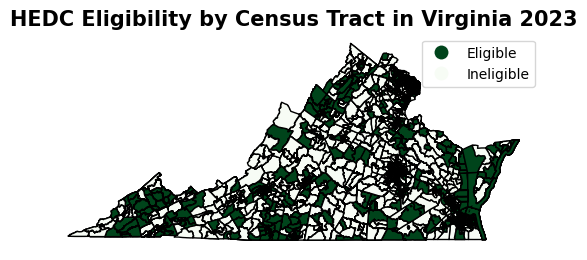

In [119]:
### Viewing the results of the output geopackage to confirm our results

#creating a new figure window:
ax = final_gdf.plot(
    column = 'HEDC_Eligibility', # column of interest
    cmap='Greens_r', # color scheme, blue to white
    legend=True,
    edgecolor='black',
)
ax.set_title(f"HEDC Eligibility by Census Tract in Virginia {ct_year}", fontsize=15, fontweight='bold') # title
ax.set_axis_off() # removing axis

#

In [ ]:
### This section has been commented out to avoid GitHub Repository Issues ###
### The below section will create an interactive map using the folium Python library ### 
# Uncomment the below section to run #
'''
import folium

# setting up the data to be added to the map
# historically economically disadvantaged communities (HEDC)
hedc = final_gdf
hedc = hedc.to_crs("4326")
hedc["geometry"] = hedc["geometry"].simplify(tolerance=0.001, preserve_topology=True) # using .simplify to reduce latency in converting the GeoDataFrame into a GeoJSON

#qualified opportunity zones (QOZ)
qoz["geometry"] = qoz["geometry"].simplify(tolerance = 0.001, preserve_topology=True)

# setting up the basics of the map
m = folium.Map(
    location=(37.926868, -78.024902),
    zoom_start = 7,
    tiles="cartodb positron")

# layer 1. adding all census tracts
folium.GeoJson(
    data=hedc,
    name = f"{ct_year} Virginia Census Tracts", 
    style_function=lambda x: {
        "fillColor": "gray",
        "color": "black",
        "weight": 0.3,
        "fillOpacity": 0.3,
    },
    tooltip=folium.GeoJsonTooltip(fields=["Full_Name", "total_population", "household_median_income", "HEDC_Eligibility"])  # update with your actual fields
).add_to(m)

# layer 2. HEDC Eligible Tracts
folium.GeoJson(
    data = hedc[hedc["HEDC_Eligibility"] == "Eligible"],
    name = "HEDC Eligibility",
    style_function = lambda x: {
        "fillColor": "blue",
        "color": "black",
        "weight": 0.5,
        "fillOpacity": 1
    },
    tooltip = folium.GeoJsonTooltip(fields=["Full_Name", "total_population", "household_median_income", "HEDC_Eligibility"])
).add_to(m)

# layer 3. Qualified Opportunity Zones, which are census tracts designated in 2017 to recieve special tax benefits for investors and are another metrics that determines HEDC eligibility
folium.GeoJson(
    data=qoz,
    name = "Qualified Opportunity Zone",
    style_function = lambda x: {
        "fillColor": "blue",
        "color": "black",
        "weight": 0.5,
        "fillOpacity": 1
    },
    tooltip = folium.GeoJsonTooltip(fields=["GovCntyNam", "NAMELSAD"])
).add_to(m)

folium.LayerControl().add_to(m)
m.save("hedcMap.html")

m
'''

### Step 6. Automating the task fully by setting a Scheduled Task <a id="step-6"></a>

* This step assumes you have access to Microsoft Windows Task Scheduler
* Step. 6.1. make sure 'papermill' is install in your activated conda environment used as the kernel for the Jupyter Notebook project
    * if 'papermill' is not installed
        * open Anaconda Prompt or conda terminal, activate conda environment
        * "conda install -c conda-forgge papermill"
        * or use "pip install papermill"
* Step 6.2. make sure the Jupyter Notebook project is saved
* Step 6.3. make sure the Batch file 'run_hedc_script.bat' is created and saved on computer
    * if that Batch file cannot be found on your computer follow the steps below
        * Open Notepad and paste the text below on a new file. Make sure to change the file names to the files where this Jupyter Notebook is saved and to name of the kernel that is being used for this project.
            * @echo off
            * cd C:\Users\location\of\document\folder
            * call conda activate *conda envrionment*
            * papermill HEDC_Analysis_v1.ipynb HEDC_Analysis_v2.ipynb
        * save the Notepad as a .bat file
* Step 6.4. Make sure the Task Scheduler is created
  * Open the Windows Task Scheduler: open up the search bar on the bottom left and type in 'Task Scheduler'
  * Click Create Basic Task
  * Name is something like: Run HEDC Map
  * Choose your trigger (monthly)
  * For action choose:
      * Start a Program
      * Browse and select the .bat file that was created in 6.3.
  * Click Finish

### Appendix A. How to make sure the Jupyter Notebook is working correctly <a id="appendix-a"></a>

* This notebook requires an internet connection. Without a stable internet connection some request will fail.
* The Jupyter Notebook envrionment needs to have an up to date version of the pyogrio engine that will allow geopandas to write the geopackage to a local file
    * This may require having to create your own conda enviornment that is capable of running all of the packages imported at the start of this notebook
* Chrome or Firefox work better for running the Census Buearu API
* This is a work in progress as updates occur in the underlying software and technology this project will need to update to meet any new requirements
* Make sure the output file path is to an existing folder

### Appendix B. Making your own conda environment
* This step may be needed if this notebook is copied and does not have the originally created environment used to run this project
* To make sure this Jupyter Notebook runs properly there may be a need to make a custom conda environment outside of the standard arcgis pro cloned environment
* This can be done by opening the "Command Prompt" on you computer, this should come up once you search "Command Prompt" in the search bar of your computer
* Follow the steps below and you'll have a kernel you can use to perform the functions of this notebook. Think of the kernel like a engine you're putting in your car to move the project along.

1. Start with creating the core environment:
    * conda create --name example_name python=3.10
    * conda activate example_name
2. Next set up the Jupyter Notebook support and make sure you can use your created environment as a kernel for the Notebook. The code below registers the environment as a kernel
    * conda install jupyter notebook ipykernel
    * python -m ipykernel install --user --name=example_name
3. Install needed geospatial packages: geopandas, pyproj, fiona, pyogrio, and shapely are some of the packages used in this project
    * conda install conda-forge geopandas shapely pyproj fiona pyogrio 
4. This project used web mapping visualizations so addition packages may need to be installed
    * conda install -c conda-forge folium matplotlib

### Appendix C. Sources and References <a id="appendix-b"></a>
* Census API User Guide: https://www.census.gov/data/developers/guidance/api-user-guide.html 
* Census API Key: https://api.census.gov/data.html
* Making maps in Jupyter Notebook with geopandas walkthrough: https://dges.carleton.ca/CUOSGwiki/index.php/Creating_Maps_in_Jupyter_Notebook_using_GeoPandas
* Making maps with folium: https://stackoverflow.com/questions/73191847/geopandas-explore-how-to-set-colormap-opacity
* Qualified Opportunity Zone source: https://vgin.vdem.virginia.gov/datasets/89d63a87bbfe41c3b96b32bfadb0bfb2_31/explore?location=37.797224%2C-79.341100%2C7.46